# Creating Interactive and Static Charts with Plotly

By Kenneth Burchfiel

Released under the MIT License

Now that we've learned how to import, clean, and analyze data, we can finally turn to one of my favorite uses of Python: *visualizations*. In this section, we'll learn how to use the Plotly library to create bar and line graphs; scatter plots; histograms; and treemaps. Our main data source will be NVCU survey data, though we'll also make use of current enrollment data for our treemaps and bookstore transaction data for our scatter plots and histograms. We'll then save these charts to both interactive HTML files and static .png files.

When I was first learning Python, I mainly used Matplotlib for my charts. Matplotlib is a great library as well, but I switched over to Plotly for as my default chart library for several reasons:

1. Plotly makes it easy to produce both interactive and static versions of a given chart. These interactive versions, which work great on websites (but can also be opened as standalone HTML files), allow users to access more information than they could via static .png or .jpg copies.

2. Plotly integrates very well with Dash, a Python library that allows you to build interactive web apps within Python. (A later section of Python for Nonprofits will demonstrate how to build both simple and more complex Dash web apps).

3. My general sense is that Plotly tends to require less code to produce my desired result than does Matplotlib, although I don't have any hard data on which to base this point.


Note: this script will create graphs using Plotly Express (https://plotly.com/python/plotly-express/), which allows you to create detailed charts with relatively few lines of code. For more complex charts, you may need to instead work with Plotly *graph objects*, which allow for more customization: however, I'd recommend using Plotly Express code within your scripts when possible. After all, as the page linked to above notes, "Any figure created in a single function call with Plotly Express could be created using graph objects alone, but with between 5 and 100 times more code."

In [1]:
import pandas as pd
import numpy as np
import plotly.express as px

from sqlalchemy import create_engine
e = create_engine('sqlite:///../Appendix/nvcu_db.db')

import sys
sys.path.insert(1, '../Appendix')
from helper_funcs import config_notebook
display_type = config_notebook(display_max_columns=8)

from IPython.display import Image # Based on 
# a StackOverflow answer from 'zach' at
# https://stackoverflow.com/a/11855133/13097194 .

## Creating bar graphs

(For more details on bar charts in Plotly, consult the `px.bar()` documentation (https://plotly.com/python/bar-charts/).)

In order to create bar graphs of NVCU survey data, we'll first import the pivot tables of this data created within PFN's Descriptive Stats section, then feed them into our Plotly graphing script.

In [2]:
df_survey_results_by_college_long = pd.read_csv(
    '../Descriptive_Stats/survey_results_by_college_long.csv')
# Capitalizing all column names will allow our charts' x and y axis labels 
# to appear capitalized by default.
df_survey_results_by_college_long.columns = [
    column.title() for column in 
    df_survey_results_by_college_long.columns]
df_survey_results_by_college_long

,Starting_Year,College,Season,Score
0,2023,STB,Fall,69.797119
1,2023,STB,Winter,64.292208
...,...,...,...,...
10,2023,STM,Winter,64.286865
11,2023,STM,Spring,76.639004


### Simple bar graphs

We'll begin by creating a bar chart that shows spring survey results by college:

In [3]:
fig_spring_survey_results_by_college = px.bar(
    df_survey_results_by_college_long.query(
    "Season == 'Spring'"), x='College', y='Score',
      title='Spring Survey Scores by College',
      color='College', text_auto='.0f')
# See https://plotly.com/python/bar-charts/

# The text_auto argument allows you to easily add bar labels using 
# a format of your choice. '.0f' rounds labels to the nearest integer;
# to show values with 2 decimal points, use '.2f' instead. You can also
# convert proportions into percentages by replacing 'f' with '%'.

fig_spring_survey_results_by_college if display_type == '.html' else None

Plotly charts are generated in HTML format by default; this lets them offer a range of interactive features, such as tooltips (extra information that appears when you hover over a chart element) and panning/zooming options. You can also filter the x axis elements by clicking once on a legend element to remove it and clicking twice to keep only that element. 

These interactive charts can easily be saved as HTML files via the write_html() function:

In [4]:
fig_spring_survey_results_by_college.write_html(
    'output/spring_results_by_college.html')

This .html file can now be opened in a web browser as a standalone document or embedded in a website for public display.

However, it's also convenient to create static copies of these charts (e.g. for use within a slide deck or a web page that doesn't allow certain HTML elements to be displayed). Thankfully, it's very simple to create static copies of these charts. We simply need to call `write_image()` instead of `write_html()`.

However, the default settings for `write_image()` produce, in my view, a relatively blurry image that isn't suitable for presenting. Therefore, the following cell include arguments for three optional parameters for `write_image()`: `height`, `width`, and `scale`. The settings shown below produce a chart with 4K resolution (3840 * 2160 pixels) whose text is also large enough to be easily readable.

In [5]:
height = 405
aspect_ratio = 16/9
width = height * aspect_ratio
scale = 2160 / height

# The above approach allows the height setting to automatically adjust
# the width and scale setting while preserving a resolution of 
# 3840 * 2160.

# The chart's height and width (in pixels) will be height * scale 
# and width * scale, respectively. Smaller height and width values will 
# result in larger (and thus more readable) text, but in order to keep 
# the resulting file sharp, I increased the scale to compensate. For 
# instance, a height of 540 will result in a scale of 4 (2160 / 540); 
# a height of 360, on the other hand, will result in a scale of 6.

# You may want to experiment with different settings in order to find the 
# result that best meets your needs.
# The 16/9 aspect ratio is used in many modern TVs and monitors, thus 
# making it ideal for full-screen displays of charts.

print("Height:",height, "\nWidth:", width, "\nScale:",scale)

fig_spring_survey_results_by_college.write_image(
    'output/spring_results_by_college.png', height=height, 
width=width, scale=scale)
# For more information about write_image, see:
# https://plotly.com/python-api-reference/generated/plotly.io.
# write_image.html

Height: 405 
Width: 720.0 
Scale: 5.333333333333333


Note: in order for the above code to work, you'll most likely need to have installed the kaleido library beforehand. When using the conda package manager on Windows, I've found that I've needed to request version 0.1.0 of kaleido when installing the library (e.g. by calling `conda install python-kaleido=0.1.0` within my command prompt); this is because the later version appears to cause image generation scripts to hang indefinitely. (I found this solution via this GitHub post: https://github.com/plotly/Kaleido/issues/134#issuecomment-1781183798). 

I haven't encountered this problem on Linux, so on that operating system (and presumably on Mac), `conda install python-kaleido` should work fine. 

The kaleido library makes creating static versions of HTML-based Plotly graphs very straightforward. In the Mapping section of Python for Nonprofits, we'll go over a more manual approach for creating static versions of HTML files (as that section will utilize a library that doesn't yet have kaleido support).

To display this image within this notebook, we can call `Image()` from IPython.display:

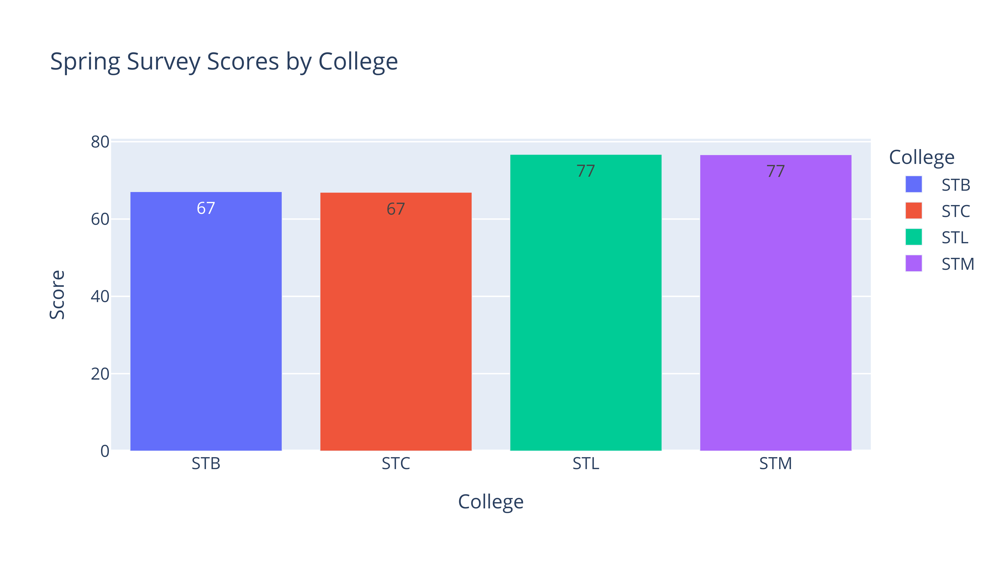

In [6]:
Image('output/spring_results_by_college.png', width=720)
# Based on the StackOverflow answer from 'zach'
# at https://stackoverflow.com/a/11855133/13097194 ;
# See also:
# https://ipython.readthedocs.io/en/stable/api/generated/IPython.display.
# html#IPython.display.Image

### Importing a function to simplify the process of saving and displaying charts

We can more easily save our Plotly charts to HTML and PNG files, then display a copy of the output by importing a function that takes care of all three operations for us. This function, `wadi()`, will get applied within other sections of Python for Nonprofits also. I highly recommend reading its source code, which can be found inside the Appendix folder's helper_funcs.py file, so that you understand what the function does and how to modify it for your own needs.

In [7]:
from helper_funcs import wadi

### More detailed bar graphs

The bar graph created above shows that STL and STM had better survey results than did STB and STC. However, NVCU's administrators will also want to know how each college's survey results changed over the course of the year. We can visualize these changes by adding `season` as our argument for the `color` variable within `px.bar()`, thus creating a chart that shows separate color-coded bars for each college/season pair. (We'll also add `barmode='group'` in order to display grouped bars rather than stacked ones.)

### Sorting DataFrames using a custom key

Note that, because 'Spring' precedes 'Winter' alphabetically, these charts will show winter results before spring results by default. We can display them in chronological order instead by sorting our DataFrame to have winter rows precede spring ones. 

The easiest way to accomplish this sort would be to first add a separate 'season_sort_order' column that contains values of 0, 1, and 2 for 'Fall', 'Winter',' and 'Spring' rows, respectively. Once this column is in place, we could then sort the DataFrame by it. However, for demonstration purposes, the following cell shows how this sort can be accomplished without adding an additional column. The approach shown below relies on the `key` argument available within `sort_values()` together with Pandas' `map()` function.

In [8]:
df_survey_results_by_college_long.sort_values(
    'Season', key=lambda col: col.map(
        {'Fall':0,'Winter':1,'Spring':2}), inplace=True)
# See https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.
# DataFrame.sort_values.html
df_survey_results_by_college_long

,Starting_Year,College,Season,Score
0,2023,STB,Fall,69.797119
3,2023,STC,Fall,69.568665
...,...,...,...,...
8,2023,STL,Spring,76.727809
11,2023,STM,Spring,76.639004


Now that the DataFrame is sorted correctly, we can create our grouped bar graph:

In [9]:
fig_survey_results_by_college_and_season = px.bar(
    df_survey_results_by_college_long, 
    x='College', y='Score', 
    title='Survey Scores by College and Season',
      color='Season', text_auto='.0f', barmode='group')

Calling `wadi` to save static and interactive copies of this chart, then display the format specified by `display_type`:

In [10]:
display_type

'png'

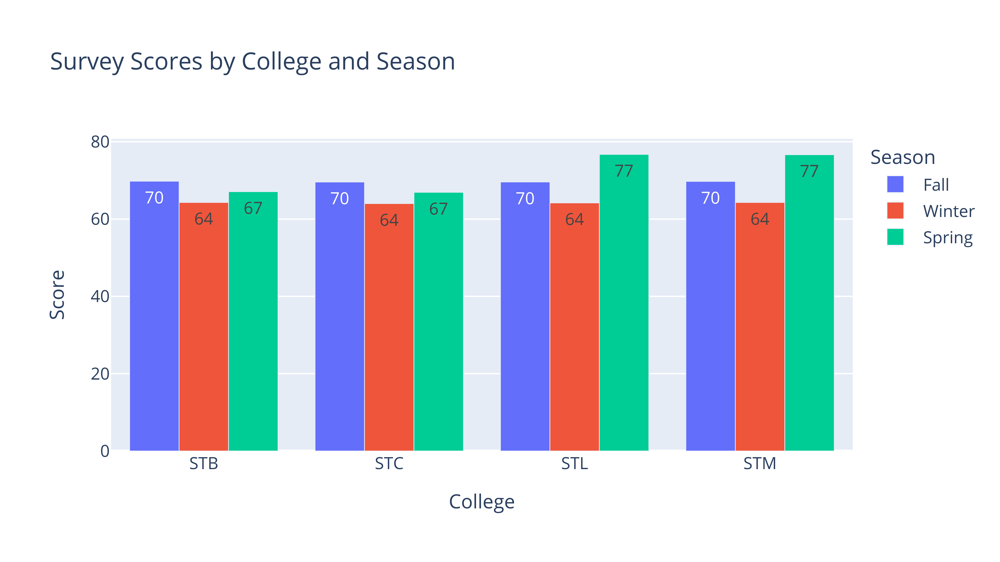

In [11]:
wadi(fig=fig_survey_results_by_college_and_season,
     file_path='output/results_by_college_and_season',
     display_type=display_type)

This graph clearly shows how each school's scores changed over time. However, in order to more easily compare results among schools for each season, we can switch the `x` and `color` arguments:

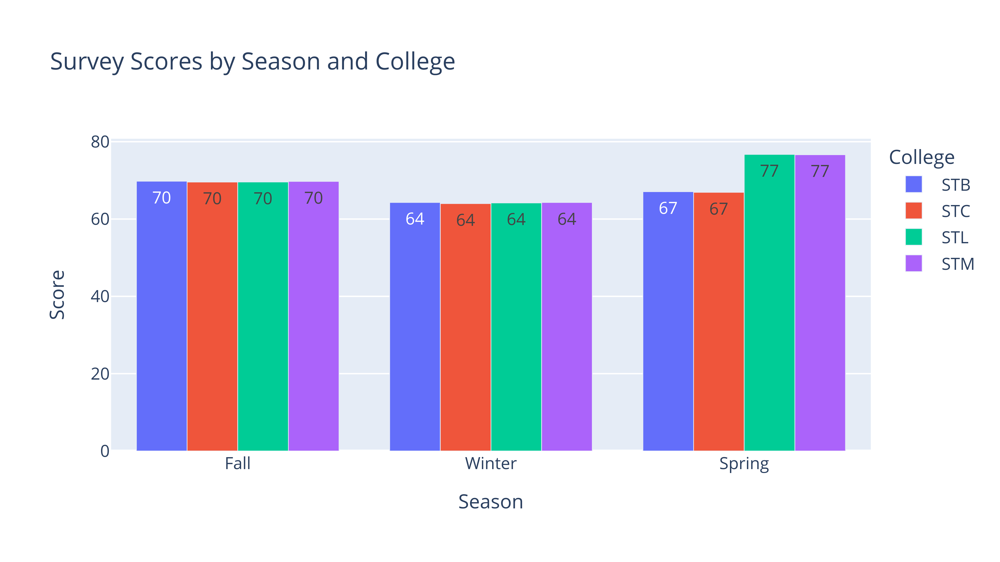

In [12]:
fig_survey_results_by_season_and_college = px.bar(
    df_survey_results_by_college_long, 
    x='Season', y='Score', 
    title='Survey Scores by Season and College',
      color='College', text_auto='.0f', barmode='group')

wadi(fig=fig_survey_results_by_season_and_college,
     file_path='output/results_by_season_and_college',
     display_type=display_type)

This chart demonstrates that each college had an average fall score around 70 followed by a 6-point drop to 64 during the winter. Although all colleges demonstrated growth from the fall to the winter, STL and STM clearly outperformed STB and STC (whose spring scores failed to match their fall scores).

### Graphing wide data

The previous two graphs used long-formatted data, meaning each row showed only one metric (in this case, one survey score). However, you may often encounter (or choose to create) tables in which multiple metrics are found within the same row. These datasets would be considered 'wide.' Here's an alternative to `df_survey_results_by_college_long` that uses a wide format:

In [13]:
df_survey_results_by_college_wide = pd.read_csv(
    '../Descriptive_Stats/survey_results_by_college_wide.csv')
df_survey_results_by_college_wide.columns = [
    column.title() for column in 
    df_survey_results_by_college_wide.columns]
df_survey_results_by_college_wide.drop('Starting_Year', axis=1)

,College,Fall,Winter,Spring,Fall-Spring Change,Fall-Winter Change,Winter-Spring Change
0,STB,69.797119,64.292208,67.077551,-2.719568,-5.504911,2.785343
1,STC,69.568665,63.994555,66.911444,-2.657221,-5.574110,2.916889
2,STL,69.596675,64.166140,76.727809,7.131134,-5.430534,12.561669
3,STM,69.735685,64.286865,76.639004,6.903320,-5.448819,12.352139


This dataset contains the same score data as df_survey_results_by_college_long, but it places those each college's seasonal scores on the same row. (This made it easier to calculate changes in scores over time, which this dataset also features.)

Here's another look at df_survey_results_by_college_long for comparison:

In [14]:
df_survey_results_by_college_long

,Starting_Year,College,Season,Score
0,2023,STB,Fall,69.797119
3,2023,STC,Fall,69.568665
...,...,...,...,...
8,2023,STL,Spring,76.727809
11,2023,STM,Spring,76.639004


Plotly makes graphing wide data like this very straightforward. Instead of passing season to the 'color' argument (as we did with the long-formatted table), we can simply add each season to a list that will then serve as our `y` argument:

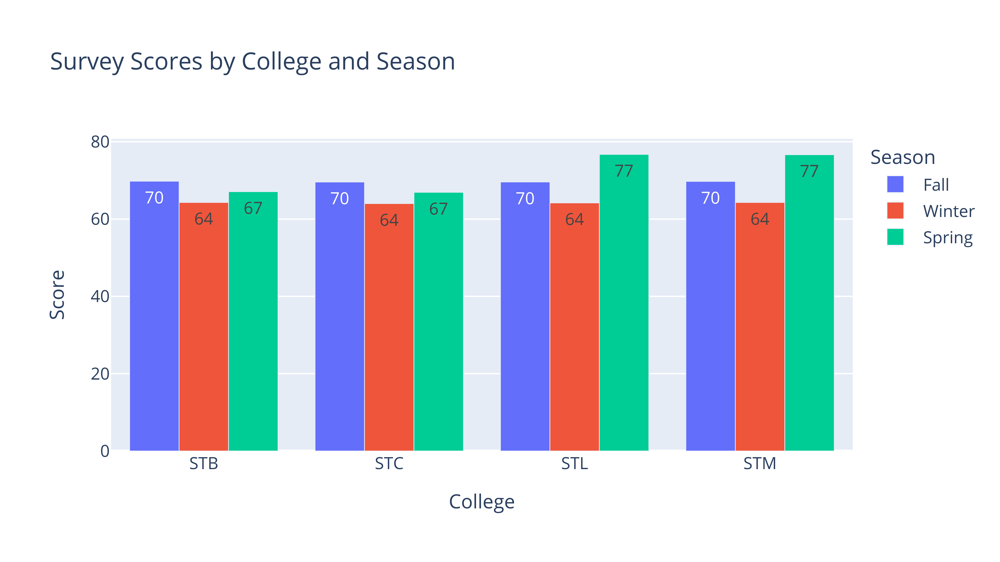

In [15]:
fig_survey_results_by_college_and_season_wide = px.bar(
    df_survey_results_by_college_wide, x='College', 
       y=['Fall', 'Winter', 'Spring'], barmode='group',
      title='Survey Scores by College and Season',
    text_auto='.0f')
# See:
# https://plotly.com/python/bar-charts/#bar-charts-with-wide-format-data

# Because we are displaying multiple y values rather than just one, Plotly
# sets the y axis and legend titles as 'value' and 'variables' by default. 
# We can change these to 'Score' and 'Season', respectively, via the 
# following code:
fig_survey_results_by_college_and_season_wide.update_layout(
    yaxis_title='Score', legend_title='Season')
# This code was based on https://plotly.com/python/figure-labels/

wadi(fig=fig_survey_results_by_college_and_season_wide,
     file_path='output/results_by_college_and_season_wide',
     display_type=display_type)

Note that this graph, though based on a 'wide' rather than 'long' dataset, is equvialent to `fig_survey_results_by_college_and_season`.

### Bar charts with three or more variables

If you need to differentiate between three different variables (such as college, level, and season), you have a few different options. One would be to represent the third variable via Plotly's `pattern_shape` argument, which adds different patterns to bars to represent different variable values. Another would be to use `facet_row` or `facet_col` to create a separate plot for each value within this third variable. Finally, you could consider grouping two variables into one via Pandas, then passing that grouped column to `px.bar()`'s `x` or `color` parameters. The following code will demonstrate each of these three options.

Reading in a dataset that shows results by school, level, *and* college (hence the use of 'slc' in the DataFrame name):

In [16]:
df_survey_results_slc = pd.read_csv(
    '../Descriptive_Stats/survey_results_slc_long.csv')
df_survey_results_slc.columns = [
    column.title() for column in 
    df_survey_results_slc.columns]

# In order for our graphs to display levels and seasons in the correct
# order, we'll add in a 'Season_For_Sorting' column (an equivalent for 
# levels already exists), then sort the DataFrame by these two columns.
# (I'm using this approach rather than the key-based one shown earlier
# because I don't believe that that one works with more than one sort 
# value.)

df_survey_results_slc['Season_For_Sorting'] = df_survey_results_slc[
'Season'].map({'Fall':0,'Winter':1,'Spring':2})
df_survey_results_slc.sort_values(['Season_For_Sorting',
                                   'Level_For_Sorting'], inplace=True)
df_survey_results_slc.drop('Season_For_Sorting', axis = 1).head()

,Starting_Year,College,Level_For_Sorting,Level,Season,Score
0,2023,STB,0,Fr,Fall,69.593583
12,2023,STC,0,Fr,Fall,69.598913
24,2023,STL,0,Fr,Fall,69.585030
36,2023,STM,0,Fr,Fall,69.650503
3,2023,STB,1,So,Fall,70.377306


### Graphing results by college, level, and season

I'll first use the `pattern_shape` argument to represent 'Level' values:

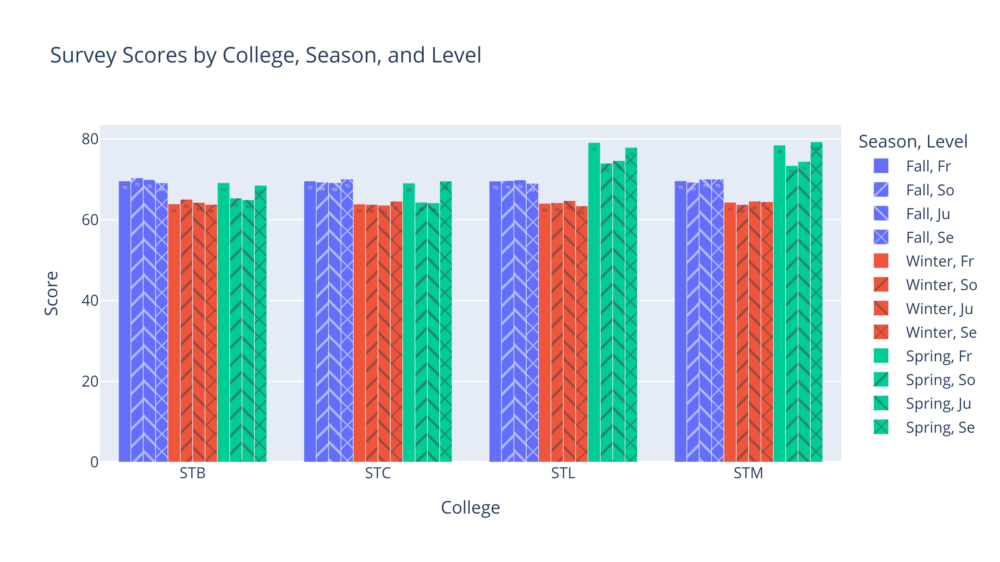

In [17]:
fig_survey_results_slc_pattern_shape = px.bar(
    df_survey_results_slc, x='College', 
    color='Season', y='Score', pattern_shape='Level', 
    barmode='group', 
    title='Survey Scores by College, Season, and Level', 
    text_auto='.0f')

wadi(fig=fig_survey_results_slc_pattern_shape,
     file_path='output/results_slc_pattern_shape',
     display_type=display_type, height=450)

This graph, as shown within the image above, is awfully cluttered and difficult to interpret. Your outcomes with `pattern_shape` might be better if you have, say, only two different values to pass to that argument (e.g. Fall and Spring results), but even then, your visualization may not be very intuitive.

As an alternative to `pattern_shape`, you might prefer to display results for a third comparison variable via the `facet_col` or `facet_row` arguments instead. Plotly will then create a separate chart for each value within the variable passed to those arguments, then display them together in the same graphic.

Here's what we get if we pass 'Level' to `facet_col` rather than to `pattern_shape`:

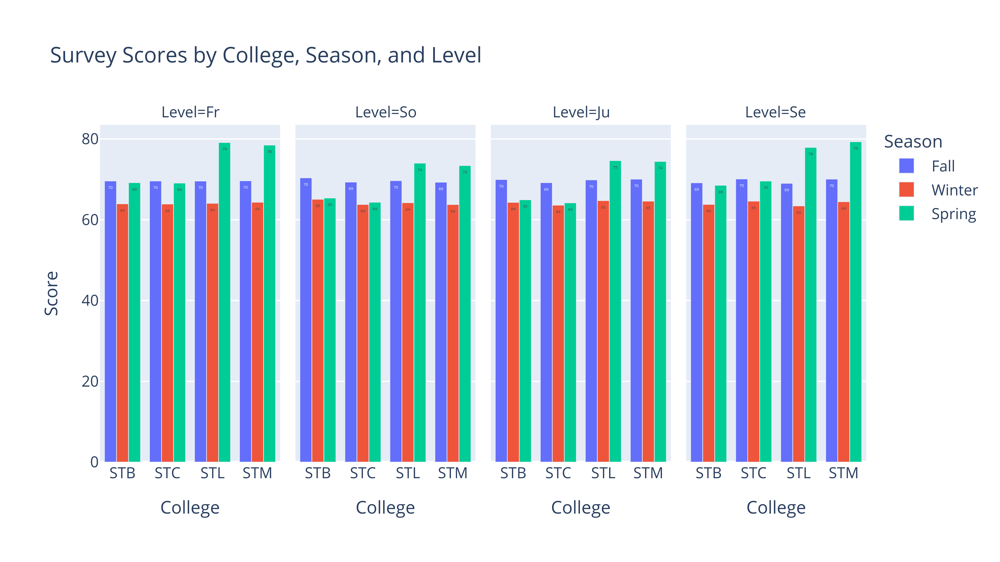

In [18]:
fig_survey_results_slc_facet_col = px.bar(
    df_survey_results_slc, x='College', 
    color='Season', y='Score', facet_col='Level', 
    barmode='group', 
    title='Survey Scores by College, Season, and Level', 
    text_auto='.0f')

wadi(fig=fig_survey_results_slc_facet_col,
     file_path='output/results_slc_facet_col',
     display_type=display_type, height=450)

Note that each of the four graphs shows data for one particular level. These graphs are displayed within separate columns inside the same row; if we instead selected `facet_row`, they would be shown within separate rows inside the same column.

A third option is to combine two fields (such as `College` and `Level`) into one, then pass that combined field to our graphing code:

In [19]:
df_survey_results_slc['College and Level'] = (
    df_survey_results_slc['College'] 
    + ' ' + df_survey_results_slc['Level'])
df_survey_results_slc.head()

,Starting_Year,College,Level_For_Sorting,Level,Season,Score,Season_For_Sorting,College and Level
0,2023,STB,0,Fr,Fall,69.593583,0,STB Fr
12,2023,STC,0,Fr,Fall,69.598913,0,STC Fr
24,2023,STL,0,Fr,Fall,69.585030,0,STL Fr
36,2023,STM,0,Fr,Fall,69.650503,0,STM Fr
3,2023,STB,1,So,Fall,70.377306,0,STB So


Now that we've combined College and Level into our `x` variable, we no longer need a `pattern_shape` or `facet_row`/`facet_col` argument:

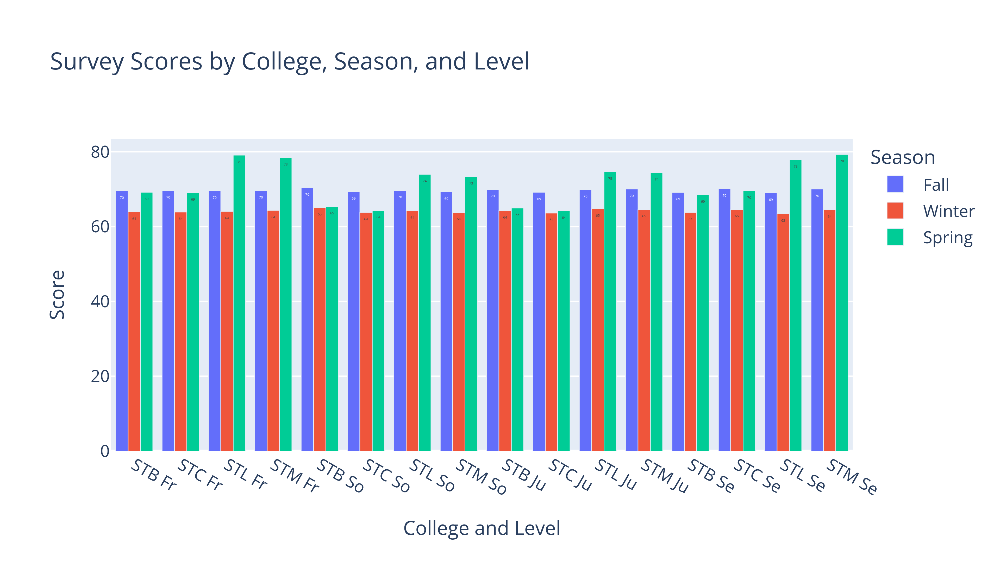

In [20]:
fig_survey_results_slc_combined_x = px.bar(
    df_survey_results_slc, x='College and Level', 
    color='Season', y='Score', barmode='group',
    title='Survey Scores by College, Season, and Level',
text_auto='.0f')

wadi(fig=fig_survey_results_slc_combined_x,
     file_path='output/results_slc_combined_x',
     display_type=display_type)

I find this chart to be somewhat more intuitive than the one that incorporated a `pattern_shape` argument, though it's still quite cluttered. However, users can simplify their view of the interactive version of this chart via Plotly's Box Select feature, which allows them to zoom in on a specific section.

If you have four or more variables to display, you could combine them via the same method used to generate the 'College and Level' column above. However, you may conclude that limiting your chart to three (or ideally two) comparison variables is a better option.

## Creating line graphs

Line graphs are an excellent choice for displaying changes in data over time. The following code will provide a basic overview of building line charts within Plotly; for more detailed instructions, I recommend referencing the Plotly Express documentation for line charts (https://plotly.com/python/line-charts/) and the plotly.express.line reference (https://plotly.com/python-api-reference/generated/plotly.express.line).

First, we'll create a simple line chart that shows how survey scores changed over time. This chart will show the same data as `fig_survey_results_by_college_and_season`, a bar chart that we created earlier; however, it will also make the divergence in spring scores between STL/STM and STC/STB more readily apparent.

Here's another look at `df_survey_results_by_college_long`, the basis for this chart, for reference:

In [21]:
df_survey_results_by_college_long

,Starting_Year,College,Season,Score
0,2023,STB,Fall,69.797119
3,2023,STC,Fall,69.568665
...,...,...,...,...
8,2023,STL,Spring,76.727809
11,2023,STM,Spring,76.639004


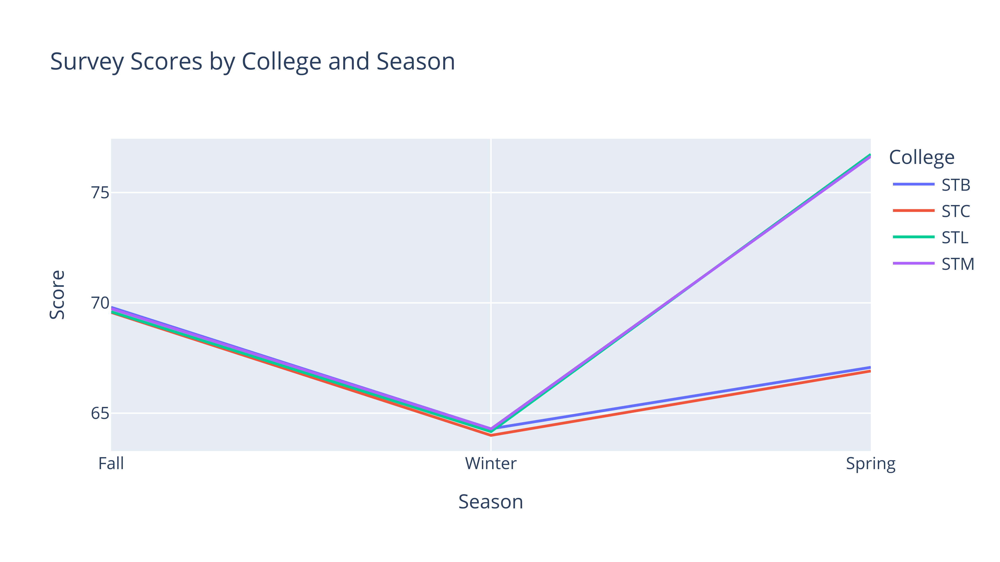

In [22]:
fig_survey_results_by_college_and_season_line = px.line(
    df_survey_results_by_college_long, x='Season', y='Score',
        color='College', title='Survey Scores by College and Season')
wadi(fig_survey_results_by_college_and_season_line,
     file_path='output/results_by_college_and_season_line',
     display_type=display_type)

### Representing multiple variables within line charts

If you need to represent more than one comparison variable in your line chart, consider assigning one to the `color` argument (as shown in the above chart) and the other one to the `line_dash` argument (as shown in the following chart). However, this approach works better if your total variable count remains quite limited.

The following chart shows how survey scores changed over time for freshmen and juniors in STC and STM. (I purposefully reduced the number of possible combinations from 16 to 4 so that the chart would remain readable. However, if you're producing an interactive chart, you could consider showing a larger number of color and dash combinations than you would within a static chart. This is because your viewers can click and double-click within legend entries in order to specify which items to keep, *and* because they can hover over specific points to verify the variables that it represents.)

This chart also adds in markers to draw readers' attention to the actual points being graphed. (You can also vary the marker type for each line (using `px.line()'s` `symbol` argument), rather than the line style, in order to designate which variable is represented by a given line.)

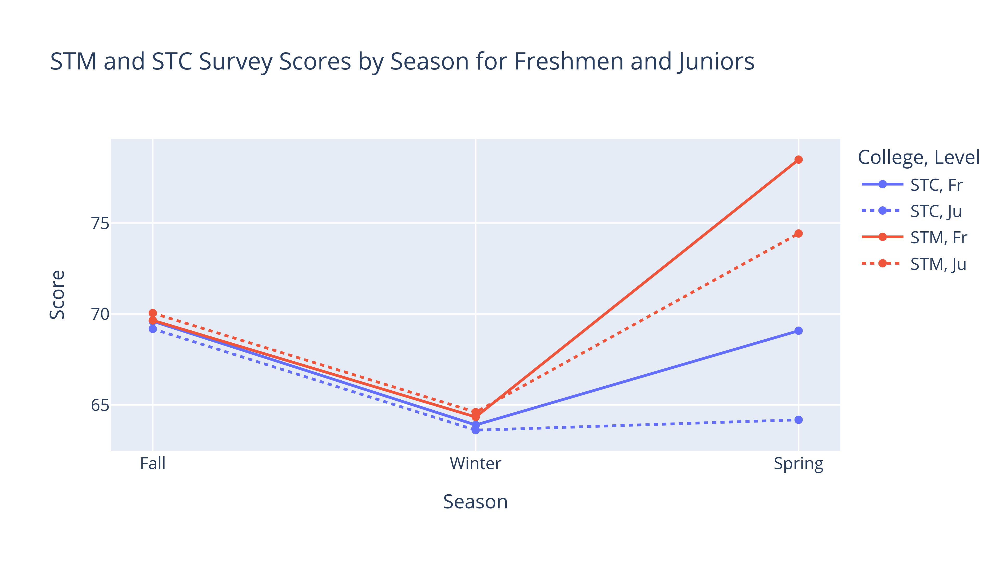

In [23]:
fig_selected_survey_results_line = px.line(
    df_survey_results_slc.query("College in ['STM', 'STC'] and Level \
in ['Fr', 'Ju']"), x='Season', y='Score',
        color='College', line_dash='Level', markers=True,
    title='STM and STC Survey Scores by Season for Freshmen and Juniors')
wadi(fig_selected_survey_results_line,
     file_path='output/selected_survey_results_line',
     display_type=display_type)

### Adding labels to points

Adding labels to line charts is relatively straightforward; however, making them readable can be a bit more challenging. For instance, if two lines overlap, their labels will also overlap by default.

Let's try adding labels to a chart that shows changes in survey scores for two schools: STB and STC. First, we'll create a new 'Rounded_Score' field within `df_survey_results_by_college_long` that we can use as text labels. (Using the original 'Score' field for our labels would display far more decimal points for each point than we need.

In [24]:
df_survey_results_by_college_long['Rounded_Score'] = (
    df_survey_results_by_college_long['Score'].round(2))
df_survey_results_by_college_long

,Starting_Year,College,Season,Score,Rounded_Score
0,2023,STB,Fall,69.797119,69.80
3,2023,STC,Fall,69.568665,69.57
...,...,...,...,...,...
8,2023,STL,Spring,76.727809,76.73
11,2023,STM,Spring,76.639004,76.64


We can add labels to our chart using `px.line()`'s `text` argument (rather than `text_auto`, which is supported for bar charts but not line charts). By default, these labels will appear directly over each point, which I find makes the chart less readable. Fortunately, we can use the `textposition` argument of `update_traces()` to provide an offset between each point and its corresponding label.

However, as shown within the first line chart we produced, STM and STC's fall and winter scores were almost identical. This means that, by default, the labels for these text options will overlap. To avoid this issue, we'll shift STC's and STM's labels *above* and *below* their corresponding points, respectively. This can be accomplished by calling `update_traces` twice, once for each line; we can then specify the line whose `textposition` value we wish to update via the `selector` argument of `update_traces()`. (For more on this argument, visit https://plotly.com/python/reference/scatter/#scatter . Special thanks to python-trader, akroma, and adamschroeder in this thread (https://community.plotly.com/t/need-to-target-a-specific-trace-by-name-when-use-update-traces-s-selector/63151/2) for helping me figure out this solution.)


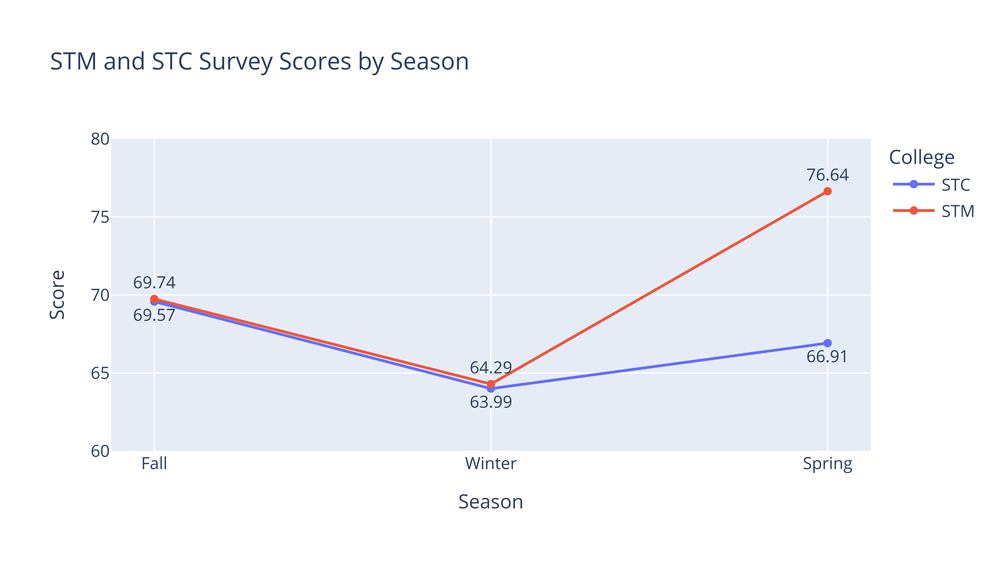

In [25]:
fig_stc_stm_survey_results_line = px.line(
    df_survey_results_by_college_long.query("College in ['STM', 'STC']"), 
    x='Season', y='Score',
        color='College', markers=True,
    text='Rounded_Score',
    title='STM and STC Survey Scores by Season').update_traces(
    textposition='top center', selector={'name':'STM'}).update_traces(
    textposition='bottom center', 
    selector={'name':'STC'}).update_layout(yaxis_range=[60, 80])

wadi(fig_stc_stm_survey_results_line,
     file_path='output/stc_stm_survey_results_line',
     display_type=display_type)

To figure out what item to pass to the 'name' argument (or another argument of your choice) of `selector`, try viewing the `.data` attribute of your image. Note that 'STC' and 'STM' are listed below as the names of each trace.

In [26]:
fig_stc_stm_survey_results_line.data

(Scatter({
     'hovertemplate': 'College=STC<br>Season=%{x}<br>Score=%{y}<br>Rounded_Score=%{text}<extra></extra>',
     'legendgroup': 'STC',
     'line': {'color': '#636efa', 'dash': 'solid'},
     'marker': {'symbol': 'circle'},
     'mode': 'lines+markers+text',
     'name': 'STC',
     'orientation': 'v',
     'showlegend': True,
     'text': array([69.57, 63.99, 66.91]),
     'textposition': 'bottom center',
     'x': array(['Fall', 'Winter', 'Spring'], dtype=object),
     'xaxis': 'x',
     'y': array([69.56866485, 63.99455477, 66.91144414]),
     'yaxis': 'y'
 }),
 Scatter({
     'hovertemplate': 'College=STM<br>Season=%{x}<br>Score=%{y}<br>Rounded_Score=%{text}<extra></extra>',
     'legendgroup': 'STM',
     'line': {'color': '#EF553B', 'dash': 'solid'},
     'marker': {'symbol': 'circle'},
     'mode': 'lines+markers+text',
     'name': 'STM',
     'orientation': 'v',
     'showlegend': True,
     'text': array([69.74, 64.29, 76.64]),
     'textposition': 'top center',
    

## Scatter plots

(For a more detailed overview of scatter plots, see https://plotly.com/python/line-and-scatter/ .)

Scatter plots represent relationships between two variables by visualizing paired copies of those variables. For instance, if we wish to see how fall and spring NVCU bookstore spending are correlated, we could create a scatter plot in which each student is represented by a point; each point's x value represents fall spending; and each point's y value represents spring spending. That's exactly what we'll do in this section!

First, we'll load in our sales data:

In [27]:
df_bookstore_sales = pd.read_sql("Select * from bookstore_sales", 
                                        con=e)
df_bookstore_sales.head()

,student_id,gender,college,level,Fall,Spring,Fall_Spring_Change
0,2020-1,F,STC,Se,66.80,58.24,-8.56
1,2020-2,F,STM,Se,104.67,151.90,47.23
2,2020-3,F,STC,Se,46.17,16.56,-29.61
3,2020-4,F,STC,Se,58.68,73.77,15.09
4,2020-5,F,STM,Se,99.73,108.78,9.05


We'll now create a scatter plot that compares Fall and Spring spending for each student. We'll also include a linear trend line that helps make sense of the relationship between these two values. (You can modify the color of this line via the `trendline_color_override` argument as noted at https://plotly.com/python/linear-fits/).

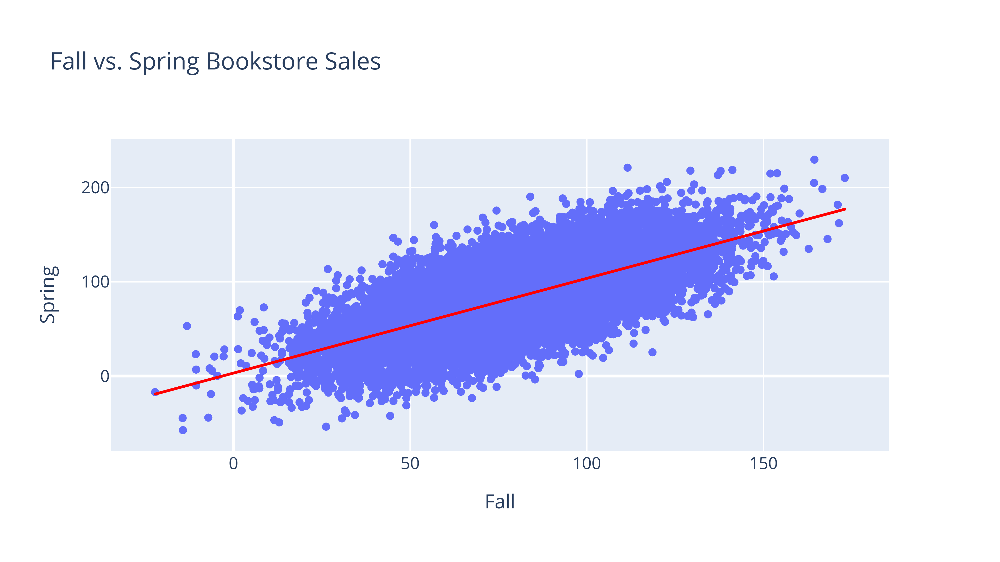

In [28]:
fig_scatter = px.scatter(df_bookstore_sales, 
           x='Fall', y='Spring',
          trendline='ols', trendline_color_override='red',
                        title='Fall vs. Spring Bookstore Sales')
wadi(fig_scatter, 'output/sales_scatter', display_type=display_type)

We can visualize additional categories using the `color` and `symbol` arguments of `px.scatter()`. The following plot uses different colors to represent levels and different symbols to represent different colleges. 

To be honest, I don't think that these added elements contribute much to this particular chart; with so many points present, it's still hard to make out anything but the overall trend (that fall and spring spending are positively correlated). However, if your scatter plot has fewer points, you may find these arguments more useful.

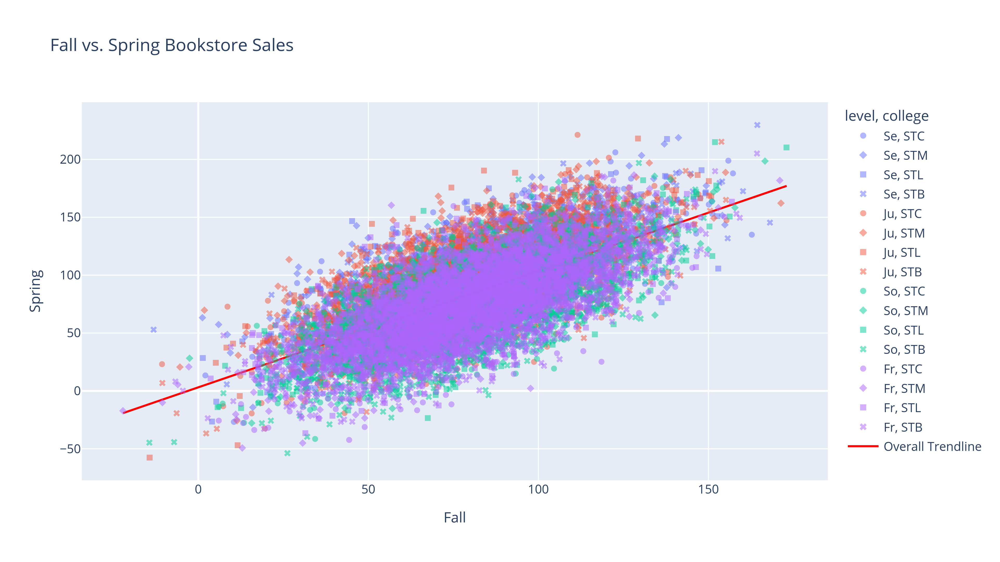

In [29]:
fig_scatter_with_color = px.scatter(df_bookstore_sales, 
           x='Fall', y='Spring', color='level', symbol='college',
                                    opacity=0.5,
          trendline='ols', trendline_color_override='red',
                                    trendline_scope='overall',
                        title='Fall vs. Spring Bookstore Sales')

# I chose a higher height value here so that all legend entries would 
# appear within the static verison of the chart.
wadi(fig_scatter_with_color, 'output/sales_scatter_with_color', 
     height=550, display_type=display_type)

## Histograms

Histograms allow you to view the number of entries in a dataset that fall into a particular range. For instance, the following histogram shows the number of students who accumulated a certain range of bookstore sales during the fall and spring semesters.

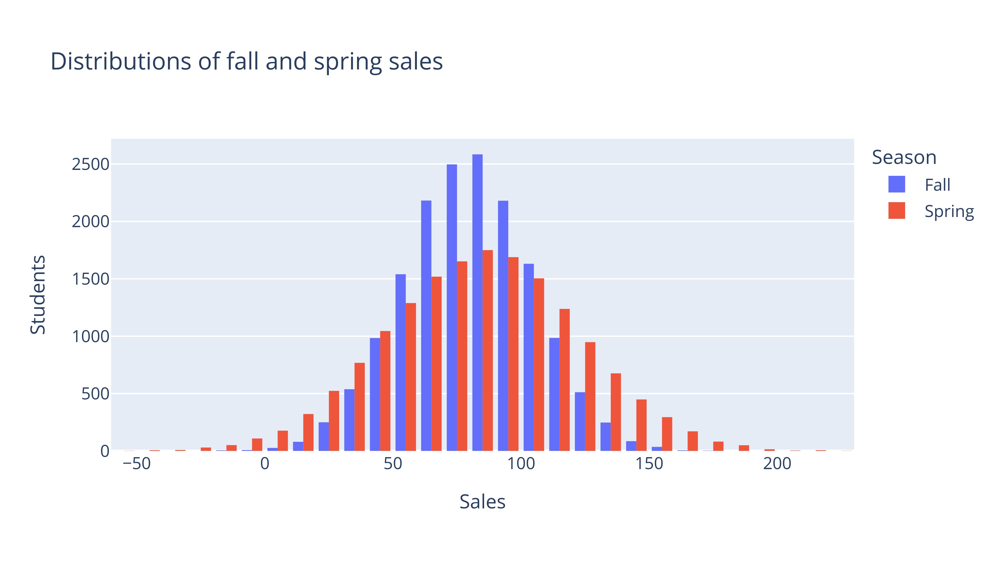

In [30]:
fig_sales_histogram = px.histogram(df_bookstore_sales, 
             x=['Fall', 'Spring'], barmode='group', nbins=30,
title='Distributions of fall and spring sales').update_layout(
    xaxis_title='Sales', yaxis_title='Students', 
    legend_title='Season')
wadi(fig_sales_histogram, 'output/sales_histogram', 
     display_type=display_type)

This histogram indicates that students' spending varied more during the spring than during the fall. It also looks like students spent more during the spring, on average, than they did during the fall.

We can confirm these hunches by calling `describe` on our underlying dataset: ('std' here stands for 'standard deviation', a measure of how dispersed a given set of values is.)

In [31]:
df_bookstore_sales.describe().loc[['count', 'mean', 'std']]

,Fall,Spring,Fall_Spring_Change
count,16384.000000,16384.000000,16384.000000
mean,80.091662,83.644286,3.552625
std,25.023476,37.297291,27.534548


To see whether these distributions varied by level, we can pass that variable as an argument to the `facet_row` parameter:

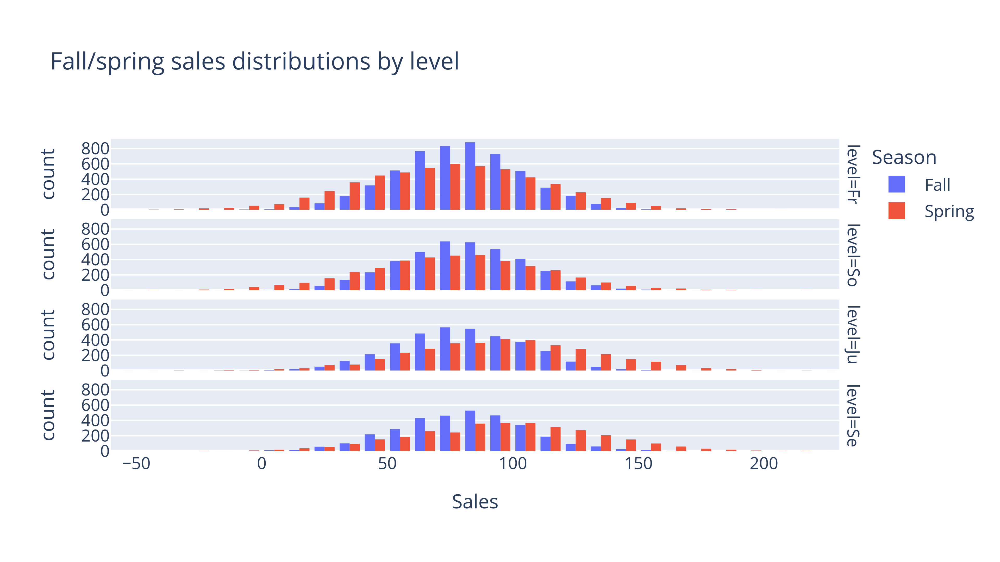

In [32]:
fig_sales_by_level = px.histogram(df_bookstore_sales.sort_values(
    'level', key=lambda col: col.map({'Fr':0,'So':1,'Ju':2, 'Se':3})), 
             x=['Fall', 'Spring'], barmode='group', nbins=30,
            facet_row='level',
            title='Fall/spring sales distributions \
by level').update_layout(
    xaxis_title='Sales', legend_title='Season')
wadi(fig_sales_by_level, 'output/sales_by_level_histogram',
     display_type=display_type)

Note that, in the output above, the spring bars appear to be shifted to the right of the fall bars for juniors and seniors, but not for freshmen and sophomores. This suggests that fall-to-spring spending growth was stronger for upperclassmen than it was for underclassmen.

If we wanted to show fall and spring spending distributions for each level/college combination, we could update our previous chart by assigning 'college' to the `facet_col` parameter:

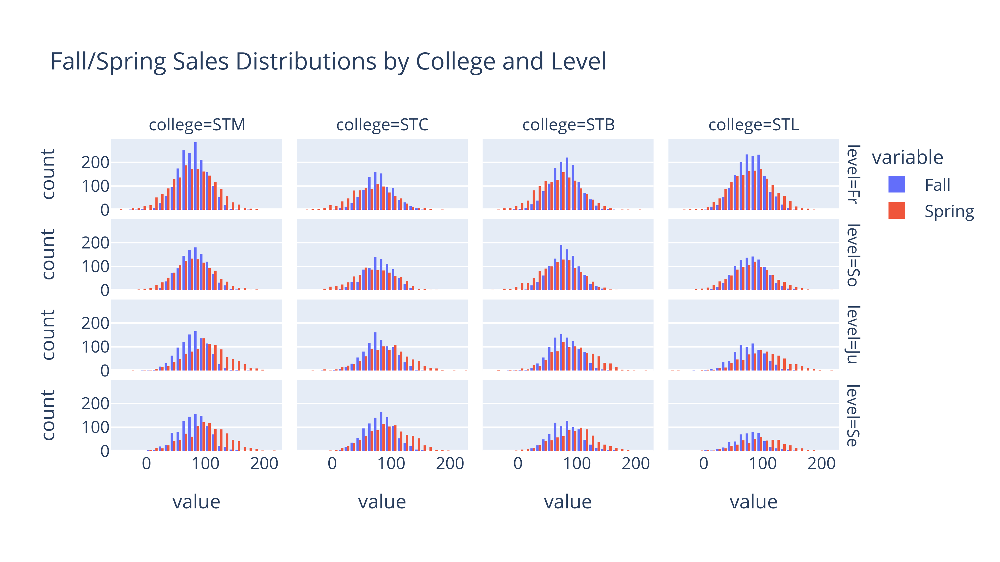

In [33]:
fig_sales_by_college_and_level = px.histogram(
    df_bookstore_sales.sort_values(
    'level', key=lambda col: col.map({'Fr':0,'So':1,'Ju':2, 'Se':3})), 
             x=['Fall', 'Spring'], barmode='group', nbins=30,
            facet_row='level',
            facet_col='college',
title='Fall/Spring Sales Distributions by College and Level')
wadi(fig_sales_by_college_and_level, 
     'output/sales_by_college_and_level_histogram', 
     display_type=display_type)

However, this type of chart will cause many readers' eyes to glaze over; the more meme-aware members of your audience might respond with "I Ain't Reading All That" (https://knowyourmeme.com/memes/i-aint-reading-all-that). As the saying goes, *Just because you can doesn't mean you should.* 

What would be a simpler way to visualize these trends? In the Regressions section of PFN, we'll create a grouped bar chart that compares average fall/spring sales growth by college and level. By replacing individual fall and spring distributions with a single growth metric, we can display all 16 level and college combinations within the same graphic.

Once you make it to the Regressions section, compare that chart (titled 'Average Fall-Spring Sales Growth by College and Level' to this one; I think you'll agree that the latter is much easier to interpret than the matrix of histograms shown above.)

## Treemaps

You might have expected to see pie charts covered in this section, and Plotly certainly supports them (https://plotly.com/python/pie-charts/). However, I would like to humbly suggest that you use *treemaps* as opposed to pie charts. Why? As Joel Abrams notes at https://theconversation.com/heres-why-you-should-almost-never-use-a-pie-chart-for-your-data-214576 , it can be hard to estimate area within pie charts alone; in addition, when many different categories are present, it can be quite hard to figure out the value corresponding to one specific category.

Abrams suggests that you consider using bar charts instead, which is perfectly fine; however, treemaps are a worthy alternative to consider as well. Because they show data in rectangular (rather than wedge-shaped form), they're much easier to interpret; in addition, they do a good job of displaying hierarchical data. (I'll also add a bar chart in this section that shows equivalent data as the tree chart, thus allowing you to compare the two.)

Loading our NVCU current enrollment table into the script:

In [34]:
df_curr_enrollment = pd.read_sql("Select * from curr_enrollment", con=e)
df_curr_enrollment['Count'] = 1

In [35]:
df_curr_enrollment.head()

,first_name,last_name,gender,matriculation_year,...,class_of,level,level_for_sorting,Count
0,Tara,Frey,F,2020,...,2024,Se,3,1
1,Amy,Baker,F,2020,...,2024,Se,3,1
2,Jessica,Koch,F,2020,...,2024,Se,3,1
3,Jennifer,Hardy,F,2020,...,2024,Se,3,1
4,Angela,Byrd,F,2020,...,2024,Se,3,1


I'll now create a 'college/level' field that will prove useful for one of our treemaps.

In [36]:
df_curr_enrollment['college/level'] = (
    df_curr_enrollment['college'] + ' (' 
    +  df_curr_enrollment['level'] + ')')

# Now that I've created this field, I'll replace the original 'level'
# values with their non-abbreviated equivalents. (The abbreviated versions
# will fit better within the combined college/level field, so I waited
# to make these changes until that field had been created.)
df_curr_enrollment['level'] = df_curr_enrollment['level'].map(
    {'Fr':'Freshman', 'So':'Sophomore', 'Ju':'Junior','Se':'Senior'})

df_curr_enrollment

,first_name,last_name,gender,matriculation_year,...,level,level_for_sorting,Count,college/level
0,Tara,Frey,F,2020,...,Senior,3,1,STC (Se)
1,Amy,Baker,F,2020,...,Senior,3,1,STM (Se)
...,...,...,...,...,...,...,...,...,...
16382,Jeffrey,Lewis,M,2023,...,Freshman,0,1,STB (Fr)
16383,Brian,Simmons,M,2023,...,Freshman,0,1,STM (Fr)


The following treemap shows NVCU's current enrollment by level and by college. The outer rectangles show the total enrollment for each level, while the inner rectangles show the enrollment distribution, by college, for all students within that level.

Note that the Freshman rectangle has the largest area and that the Senior rectangle has the smallest; this suggests that NVCU's enrollment is growing (though it could also indicate an attrition problem--which, fortunately for NVCU, isn't the case.) Also note that, while STL's rectangle within the Senior field is relatively small relative to those for the other schools, its relative size within the Freshman rectangle is much larger. This suggests that STL has become more popular (relative to other colleges) over time, though it could also indicate that students tend to transfer out of it between their first and last years at NVCU.

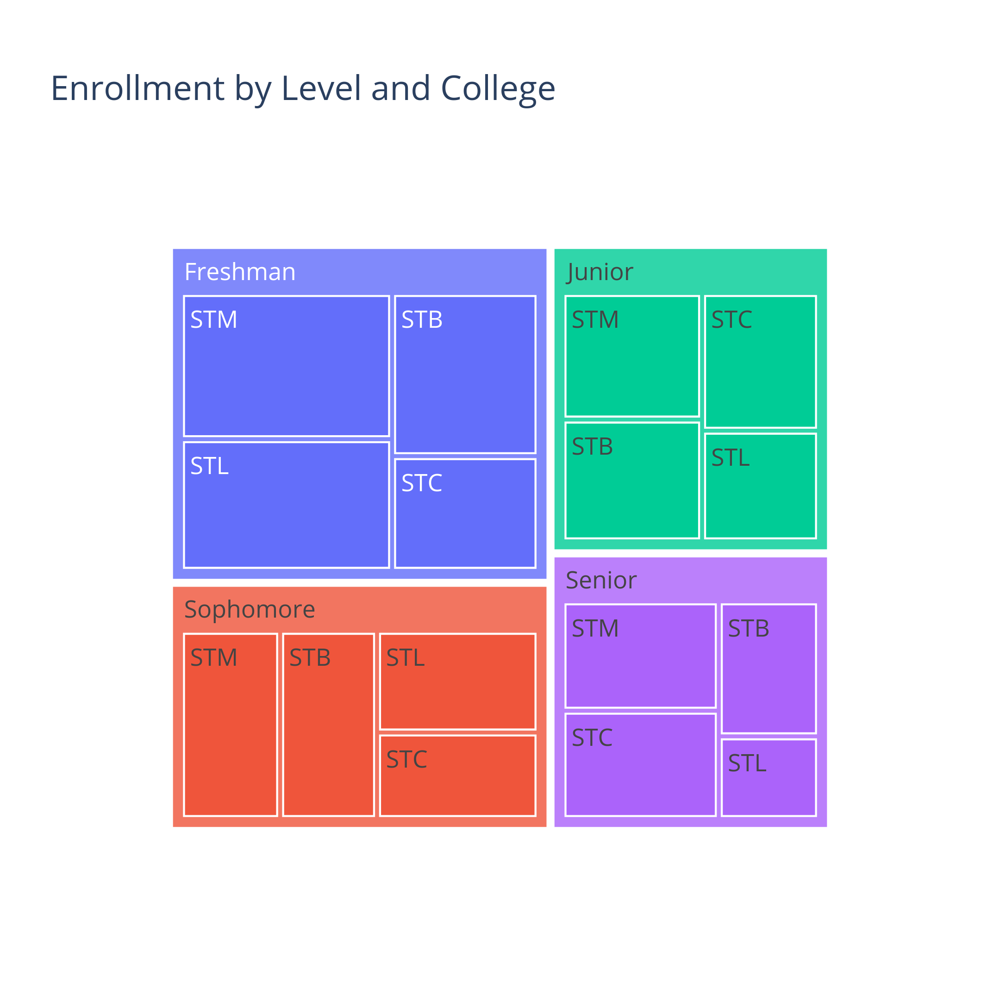

In [37]:
fig_level_college_treemap = px.treemap(
    df_curr_enrollment, path=['level', 'college'], 
    values='Count', branchvalues='total',
title='Enrollment by Level and College')

# In the following wadi() call, setting aspect ratio to 1 makes our
# chart square and thus a bitmore compact. (I'll use this same ratio for 
# the other treemaps in this script.)
wadi(fig_level_college_treemap, 'output/treemap_level_college', 
     height=500, aspect_ratio=1,
     display_type=display_type, display_width=500)

In this treemap, college enrollments are nested within level-wide enrollments. However, as shown below, we can use the 'college/level' field within `df_curr_enrollment` to create an 'ungrouped' equivalent of this chart. We'll color the rectangles within this chart by college to make our output, which is sorted by size, somewhat more intuitive.

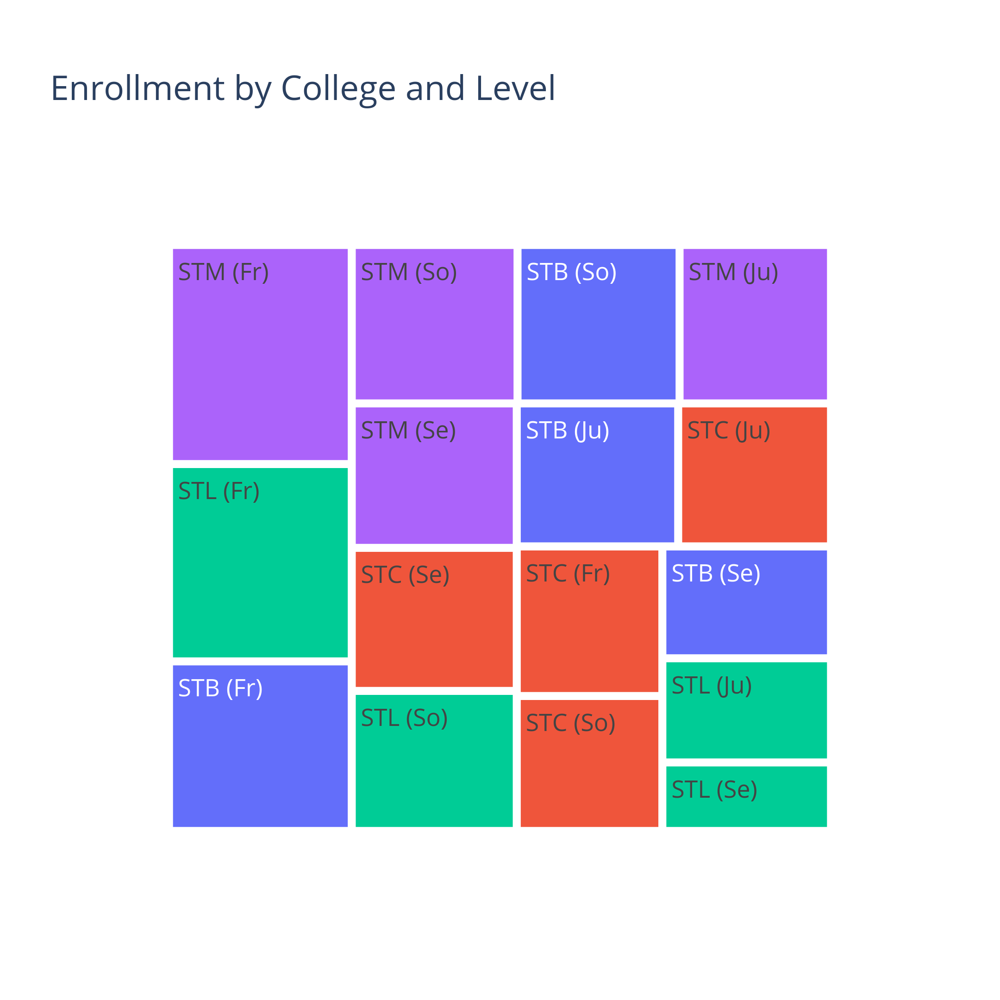

In [38]:
fig_level_college_treemap_ungrouped = px.treemap(
    df_curr_enrollment, path=['college/level'], 
    values='Count', color='college',
width=600, height=600, 
title='Enrollment by College and Level')
wadi(fig_level_college_treemap_ungrouped, 
     'output/treemap_level_college_ungrouped',
     height=500, aspect_ratio=1,
     display_type=display_type, display_width=500)

We can view the relative size of our enrollments for each level a bit more clearly within the following treemap, which groups students by level only.

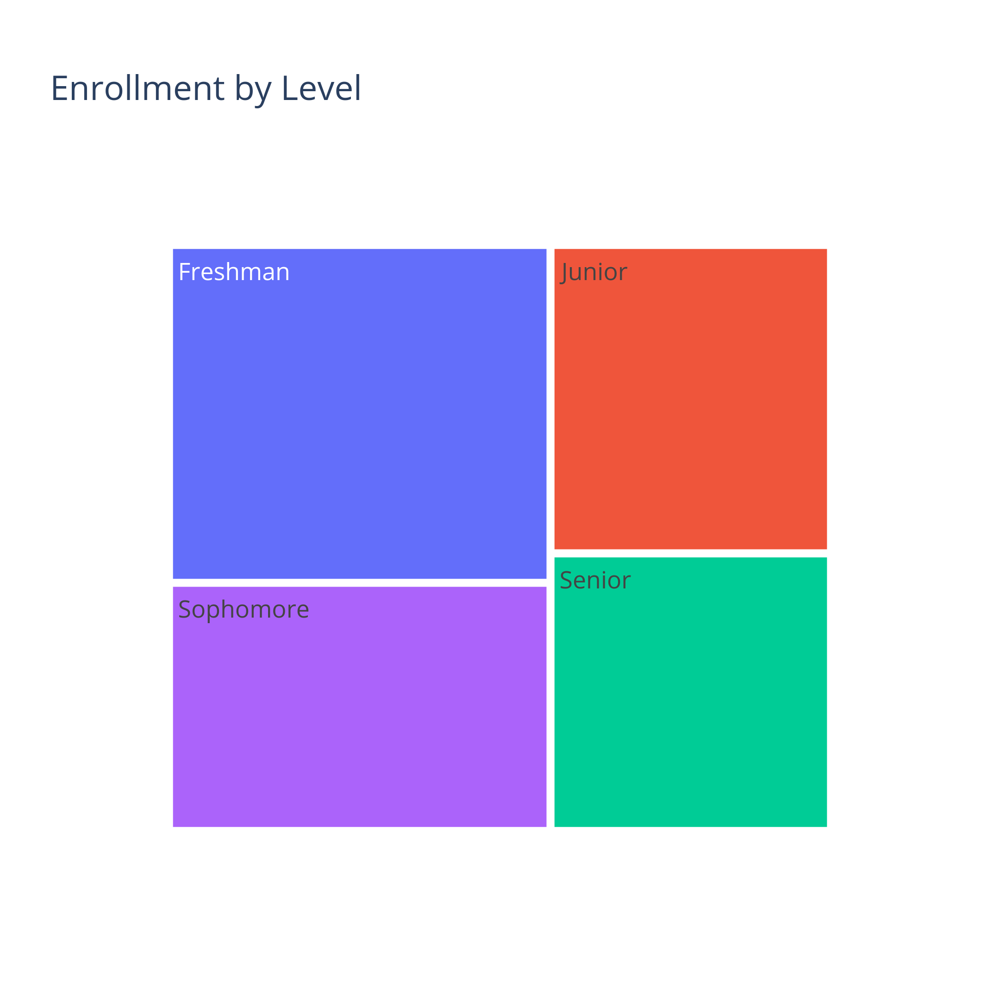

In [39]:
fig_level_treemap = px.treemap(
    df_curr_enrollment, path=['level'], 
    values='Count', color='level',
title='Enrollment by Level')
wadi(fig_level_treemap, 'output/treemap_level',
     height=500, aspect_ratio=1,
     display_type=display_type, display_width=500)

Getting data labels inserted into treemaps created with Plotly Express is trickier than it is for bar charts, as there's no `text_auto` or `text` argument within the `px.treemap()` function. (See https://plotly.com/python-api-reference/generated/plotly.express.treemap for reference.) 

If your chart is HTML-based (i.e. interactive), users will still be able to view the actual values corresponding to a rectangle when they hover over it. However, if you need these labels to show up within a static chart, you could create a new field that shows both categories *and* their values, then pass *that* field to the `path` argument of `px.treemap()`. The following cells provide an example of this approach.

We'll first create a pivot table that shows enrollment by level, then add a new field to it that contains both level names and enrollment totals.

In [40]:
df_enrollment_by_level = df_curr_enrollment.pivot_table(
    index=['level_for_sorting', 'level'], values='Count', 
    aggfunc='sum').reset_index().rename(
    columns={'Count':'Enrollment', 'level':'Level'})

# Creating a column that contains both enrollment totals by level
# and the name of that level: 
# (These levels will be converted to plural forms by appending 's' to
# them. The script will also add in a correction for the plural version
# of 'freshman.')
df_enrollment_by_level['Labeled Enrollment'] = (
df_enrollment_by_level['Enrollment'].astype('str') 
+ ' ' + df_enrollment_by_level['Level'] + 's').str.replace(
    'Freshmans','Freshmen')

df_enrollment_by_level

,level_for_sorting,Level,Enrollment,Labeled Enrollment
0,0,Freshman,5443,5443 Freshmen
1,1,Sophomore,3999,3999 Sophomores
2,2,Junior,3653,3653 Juniors
3,3,Senior,3289,3289 Seniors


Next, we'll incorporate this 'Labeled Enrollment' field into a new treemap:

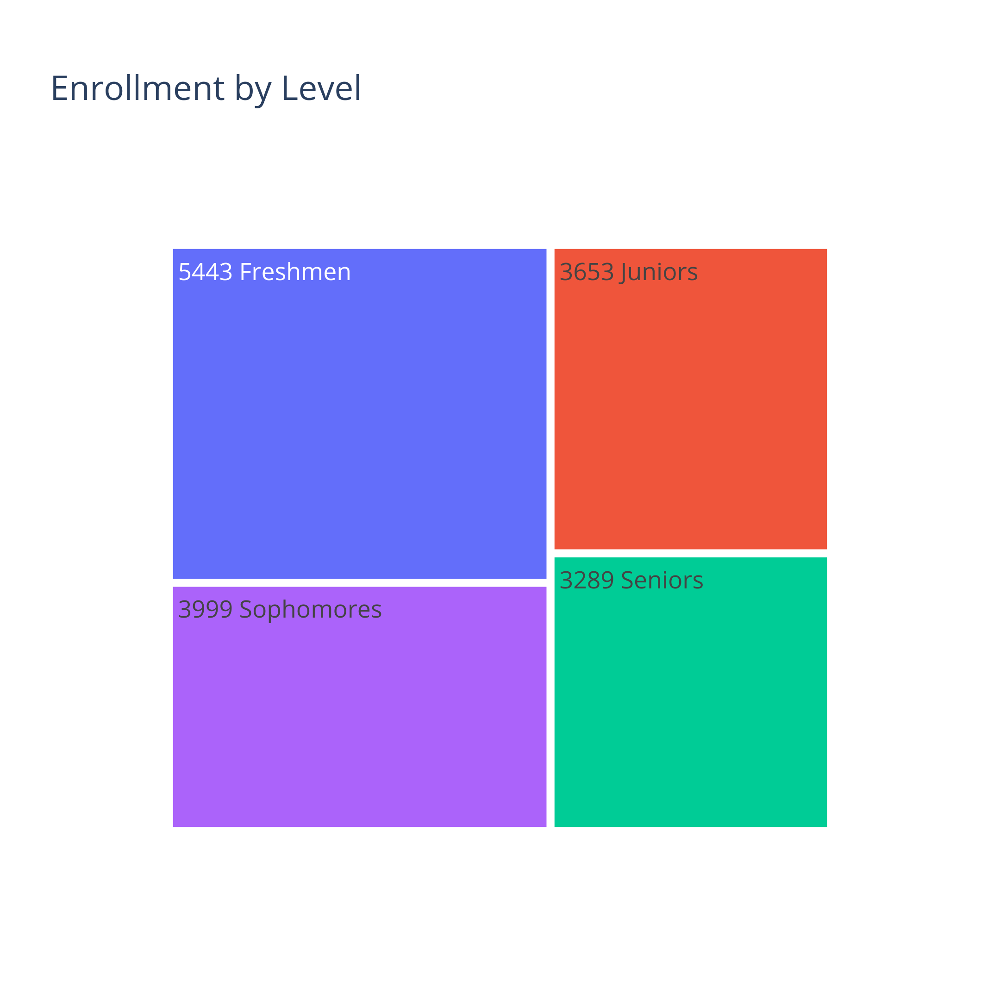

In [41]:
fig_labeled_level_treemap = px.treemap(
    df_enrollment_by_level, path=['Labeled Enrollment'], 
    values='Enrollment', color='Level',
title='Enrollment by Level')
wadi(fig_labeled_level_treemap, 'output/treemap_labeled_levels',
     height=500, aspect_ratio=1,
     display_type=display_type, display_width=500)

## Comparing these treemaps to bar charts

As Joel Abrams pointed out, you can use bar charts to display totals as well. Let's create a bar-chart equivalent of our 'Enrollment by Level and College' treemap so that you can more easily compare these two visualization types. 

First, we'll create a pivot table that can serve as the basis for this chart:

In [42]:
df_enroll_pivot = df_curr_enrollment.pivot_table(
    index=['level_for_sorting', 'level', 'matriculation_year', 
             'college'], values='Count', 
    aggfunc='sum').reset_index()
df_enroll_pivot.rename(columns = {'matriculation_year':
                                   'Matriculation Year',
                                   'college':'College',
                                   'Count':'Enrollment',
                                  'level':'Level'}, inplace=True)

# Converting the Matriculation Year to a string will ensure that these 
# values, when used as x axis labels within an upcoming line chart,
# will appear as distinct items rather than a range. We could also
# achieve this outcome after creating a chart by applying
# the following code:
# fig.update_layout(xaxis_type='category')

df_enroll_pivot['Matriculation Year']
df_enroll_pivot['Matriculation Year'] = (
    df_enroll_pivot['Matriculation Year'].astype('str'))
df_enroll_pivot

,level_for_sorting,Level,Matriculation Year,College,Enrollment
0,0,Freshman,2023,STB,1309
1,0,Freshman,2023,STC,920
...,...,...,...,...,...
14,3,Senior,2020,STL,488
15,3,Senior,2020,STM,1007


Next, we'll create our bar chart. Note that the output shows the same values as our earlier 'Enrollment by Level and College' treemap; these values are simply arranged differently. 

I'll admit that I *do* prefer this bar chart over its corresponding treemap, as the former does a better job of highlighting the differences in enrollment totals between each level.

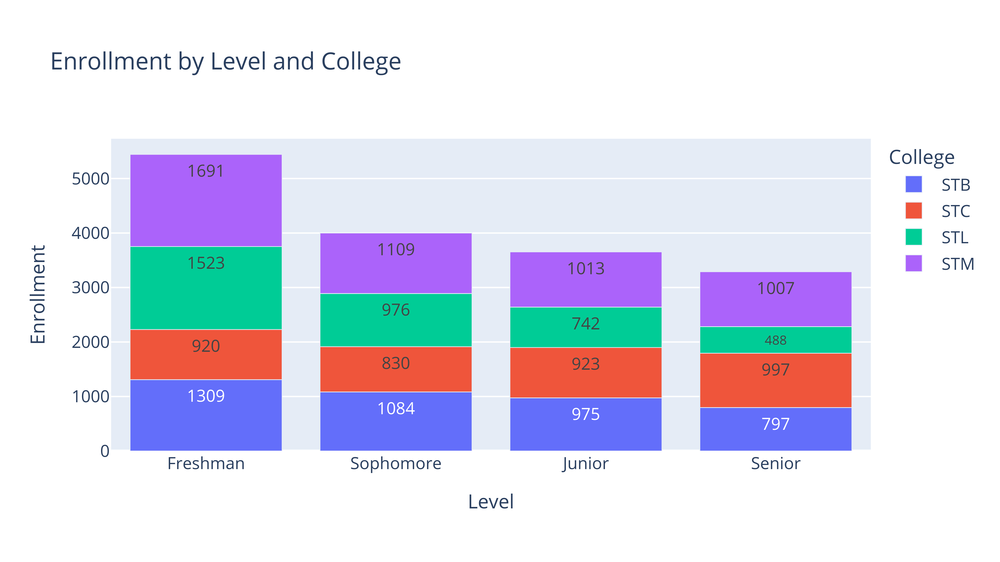

In [43]:
fig_enroll_bar = px.bar(
    df_enroll_pivot, 
        x='Level', y='Enrollment', 
       color='College', text_auto='.0f',
title='Enrollment by Level and College')
wadi(fig_enroll_bar, 'output/enroll_bar', display_type=display_type)

If we replace Level as our x-axis value with Matriculation Year, we can also create a line graph that indicates how freshman enrollment at each college has grown over time. (Most of the seniors in our current enrollment dataset matriculated in 2020, and would thus be considered freshmen in that year; juniors matriculated in 2021; sophomores matriculated in 2022; and freshmen matriculated in 2023.)

\**(I say 'indicates' here because we're working off a *current* enrollment dataset that does not take transfers or attrition into account; if NVCU had lots of attrition for a given year, or many transfers, this chart would thus underestimate or overestimate freshman enrollment for that year, respectively.)*

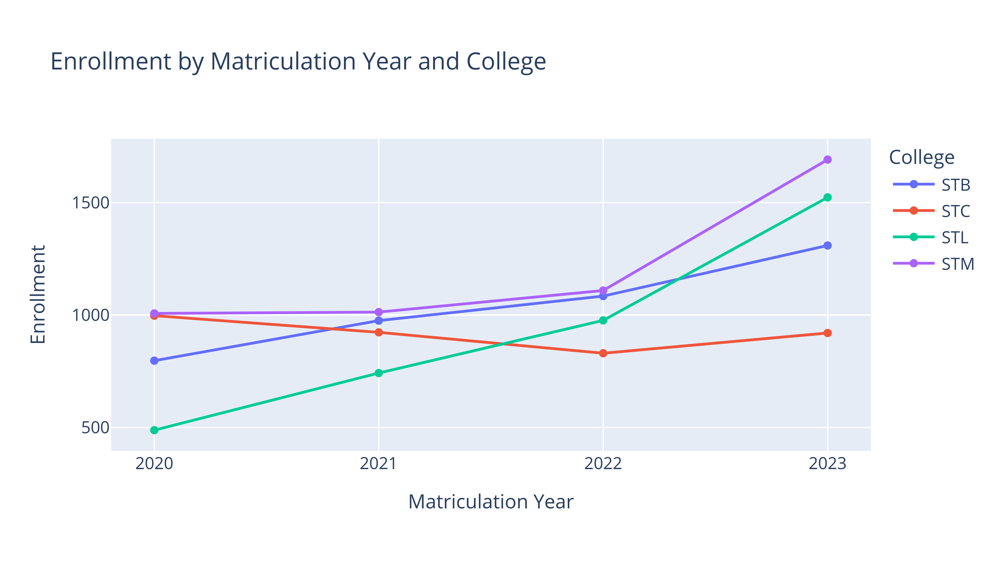

In [44]:
fig_enroll_line = px.line(df_enroll_pivot.sort_values(
    'Matriculation Year'), 
        x='Matriculation Year', y='Enrollment',
       color='College',
       title='Enrollment by Matriculation Year and College',
                          markers=True)
wadi(fig_enroll_line, 'output/enroll_line', display_type=display_type)

This chart shows some intriguing patterns. First, it's evident that freshman enrollment has grown over time (barring the caveats about this dataset that I explained earlier). However, this growth is not uniform across colleges: while STL has had particularly strong growth in freshman enrollment, STC's numbers are actually lower now than they were back in 2020.

That does it for the first part of the Graphing section. In the following Pivot and Graph Functions notebook, you'll learn how to speed up the process of creating pivot tables and charts--a skill that will prove especially useful when we begin creating interactive online visualizations.